# Convolutional Neural Networks 

In [1]:
!pip install -q otter-grader pandoc torch torchvision scikit-learn seaborn optuna

In [1]:
# Initialization Cell
try:
    content_path = "define your content path"
    import otter
    import os
    if not os.path.exists(f'{content_path}tests'):
        raise ValueError('Cannot find the public tests folder')
    grader = otter.Notebook(
        f'{content_path}DL_CNN.ipynb',
        tests_dir=f'{content_path}tests')
    import matplotlib.pyplot as plt 
    import numpy as np
    rng_seed = 90
except:
    import otter
    grader = otter.Notebook("DL_CNN.ipynb")
    import matplotlib.pyplot as plt
    import numpy as np
    rng_seed = 90


## Introduction
In this Notebook we will explore various deep learning functionalities through implementing a number of pytorch neural network operations/layers and creating our own deep learning model and methodology for a high dimensional classification problem.

#### Intended learning outcomes
- An understanding of the mechanics behind convolutional, pooling, linear and batch norm operations. 
- Be able to implement convolution, pooling, linear and batch norm layers from basic building blocks.
- Experience designing, implementing and optimising a classifier for a high dimensional dataset.

## Part 1

In this part, we will use basic Pytorch operations to define the 2D convolution, 2D max pooling, linear layer, as well as 2D batch normalization operations.

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class Conv2d(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 kernel_size,
                 stride=1,
                 padding=0,
                 bias=True):

        super(Conv2d, self).__init__()
        """
        An implementation of a convolutional layer.

        The input consists of N data points, each with C channels, height H and
        width W. We convolve each input with F different filters, where each filter
        spans all C channels and has height H' and width W'.

        Parameters:
        - w: Filter weights of shape (F, C, H', W',)
        - b: Biases of shape (F,)
        - kernel_size: Union[int, (int, int)], Size of the convolving kernel
        - stride: Union[int, (int, int)], Number of pixels between adjacent receptive fields in the
            horizontal and vertical directions.
        - padding: Union[int, (int, int)], Number of pixels that will be used to zero-pad the input.
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Define the parameters used in the forward pass
        ...
        # Do not initialize weights or biases with torch.empty() but rather use torch.zeros()
        # Weights should have shape [out_channels, in_channels, kernel_x, kernel_y]
        # ...
        self.F = out_channels
        self.C = in_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

        if bias:
          self.b = torch.zeros(self.F)
        else:
          self.b = None
        if type(kernel_size) == int:
          self.w = torch.zeros(self.F, self.C, kernel_size, kernel_size)
        else:
          self.w = torch.zeros(self.F, self.C, kernel_size[0], kernel_size[1])
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, F, H', W').
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        N, C, H, W = x.shape
        unfold_x = F.unfold(x, kernel_size=self.kernel_size, stride=self.stride, padding=self.padding)
        # Perform the convolution-like operation
        unfold_out = unfold_x.transpose(1, 2).matmul(self.w.view(self.w.size(0), -1).t()).transpose(1, 2)
        
        if type(self.kernel_size) == int:
          x_ker = self.kernel_size 
          y_kern = self.kernel_size
        else:
          x_ker, y_kern = self.kernel_size
        
        if type(self.padding) == int:
          xpad = self.padding
          ypad = self.padding
        else:
          xpad, ypad = self.padding

        if type(self.stride) == int:
          xstr = self.stride
          ystr = self.stride
        else:
          xstr, ystr = self.stride
        out_w =  math.floor(((W - y_kern + 2 * ypad) / ystr + 1))
        out_h =  math.floor(((H - x_ker + 2 * xpad) / xstr + 1))
        
        
        # Folding back output into the original shape of the input 
        out = F.fold(unfold_out, (out_h, out_w), (1, 1)) 

        if self.b is not None:
            out += self.b.view(-1, self.F, 1, 1) 

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out 

In [3]:
grader.check("Convolution Layer")

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MaxPool2d(nn.Module):
    def __init__(self, kernel_size):
        super(MaxPool2d, self).__init__()
        """
        An implementation of a max-pooling layer.

        Parameters:
        - kernel_size: Union[int, (int, int)], the size of the window to take a max over
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        ...
        self.kernel_size = kernel_size
   
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, C, H', W').
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ...
        # Calculate the output dimensions

        # Unfold the input tensor
        N, C, H, W = x.shape
        
        unfold = F.unfold(x, kernel_size=self.kernel_size, stride=self.kernel_size)

        if type(self.kernel_size) == int:
          xkern = self.kernel_size
          ykern = self.kernel_size
          xstr = self.kernel_size
          ystr = self.kernel_size
        else:
          xkern, ykern = self.kernel_size 
          xstr, ystr = self.kernel_size 
    
        unfold = unfold.view(N, C, int(unfold.shape[1]/C), -1).max(2)[0]
        out_w = int((W - ykern) / ystr + 1)
        out_h = int((H - xkern) / xstr + 1)
        
        
        
        out = F.fold(unfold, (out_h, out_w), (1, 1))
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out


In [5]:
grader.check("MaxPool Layer")

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed

In [6]:
class Linear(nn.Module):
    def __init__(self, in_channels, out_channels, bias=True):
        super(Linear, self).__init__()
        """
        An implementation of a Linear layer.

        Parameters:
        - weight: the learnable weights of the module of shape (in_channels, out_channels).
        - bias: the learnable bias of the module of shape (out_channels).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


        # Initialize weights and biases
        self.w = torch.zeros(in_channels, out_channels)
        self.bias = bias
        self.b = torch.zeros(out_channels) if bias else None
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, *, H) where * means any number of additional
        dimensions and H = in_channels
        Output:
        - out: Output data of shape (N, *, H') where * means any number of additional
        dimensions and H' = out_channels
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ...
         # Apply linear transformation: y = xW^T + b
        out = x.matmul(self.w)
        if self.bias:
            out += self.b
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [7]:
grader.check("Linear Layer")

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

In [15]:
class BatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-05, momentum=0.1):
        super(BatchNorm2d, self).__init__()
        """
        An implementation of a Batch Normalization over a mini-batch of 2D inputs.
        
        The mean and standard-deviation are calculated per-dimension over the
        mini-batches and gamma and beta are learnable parameter vectors of
        size num_features.
        
        Parameters:
        - num_features: C from an expected input of size (N, C, H, W).
        - eps: a value added to the denominator for numerical stability. Default: 1e-5
        - momentum: the value used for the running_mean and running_var
        computation. Default: 0.1 . (i.e. 1-momentum for running mean)
        - gamma: the learnable weights of shape (num_features).
        - beta: the learnable bias of the module of shape (num_features).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        
        # Initialize gamma and beta
        self.gamma = nn.Parameter(torch.ones(num_features))
        self.beta = nn.Parameter(torch.zeros(num_features))
        
        # Initialize running mean and variance
        self.running_mean = torch.zeros(num_features)
        self.running_var = torch.ones(num_features)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        During training this layer keeps running estimates of its computed mean and
        variance, which are then used for normalization during evaluation.
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data of shape (N, C, H, W) (same shape as input)
        """
        # TODO: Implement the forward pass                                     #
        #       (be aware of the difference for training and testing)          #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        if self.training:
            # Calculate mean and variance across batch, height, and width dimensions
            batch_mean = x.mean(dim=(0, 2, 3), keepdim=True)
            batch_var = x.var(dim=(0, 2, 3), keepdim=True, unbiased=False)
            
            # Update running estimates
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * batch_mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * batch_var
            
            # Normalize the input using batch statistics
            normalized_tensor = (x - batch_mean) / torch.sqrt(batch_var + self.eps)
        else:
            # Normalize the input using running estimates for evaluation
            normalized_tensor = (x - self.running_mean) / torch.sqrt(self.running_var + self.eps)
        
        # Scale and shift the normalized tensor
        out = self.gamma.view(1, self.num_features, 1, 1) * normalized_tensor + self.beta.view(1, self.num_features, 1, 1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [16]:
grader.check("BatchNorm Layer")

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

## Part 2

In this part, we will design, train and optimise a custom deep learning model for classifying a specially selected subset of Imagenet. Termed NaturalImageNet, it is made up of a hand selected subset of the famous ImageNet dataset. The dataset contains 20 classes, all animals from the natural world. We hope that this dataset will be fun to work with but also a challenge.

**Task**
1. We will Develop/adapt a deep learning pipeline to maximise performance on the test set.

**Downloading NaturalImageNet**

In [19]:
ON_COLAB = False

!wget https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
!wget https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
if ON_COLAB:
    !unzip /content/NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip /content/NaturalImageNetTrain.zip?download=1 > /dev/null
else: 
    !unzip NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip NaturalImageNetTrain.zip?download=1 > /dev/null

In [20]:
#torch
import torch
from torch.nn import Conv2d, MaxPool2d
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR
#other
import matplotlib.pyplot as plt
import numpy as np
# set the seed for reproducibility
rng_seed = 90
torch.manual_seed(rng_seed)

In [21]:
# When we import the images we want to first convert them to a tensor. 
# It is also common in deep learning to normalise the the inputs. This 
# helps with stability.
# To read more about this subject this article is a great one:
# https://towardsdatascience.com/understand-data-normalization-in-machine-learning-8ff3062101f0

# transforms is a useful pytorch package which contains a range of functions
# for preprocessing data, for example applying data augmentation to images 
# (random rotations, blurring the image, randomly cropping the image). To find out
# more please refer to the pytorch documentation:
# https://pytorch.org/docs/stable/torchvision/transforms.html

mean = torch.Tensor([0.485, 0.456, 0.406])
std = torch.Tensor([0.229, 0.224, 0.225])

# Transform for training data with augmentation
train_transform = transforms.Compose(
    [
        transforms.RandomResizedCrop(256),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean.tolist(), std.tolist()),
    ]
)

# Transform for validation and testing data (no augmentation)
val_test_transform = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean.tolist(), std.tolist()),
    ]
)

train_path = ('/content/' if ON_COLAB else '') + 'NaturalImageNetTrain'
test_path = ('/content/' if ON_COLAB else '') +'NaturalImageNetTest'

# Load datasets
train_dataset = datasets.ImageFolder(train_path, transform=train_transform)
test_dataset = datasets.ImageFolder(test_path, transform=val_test_transform)


# Create train val split
n = len(train_dataset)
n_val = int(n/10)

train_set, val_set = torch.utils.data.random_split(train_dataset, [n-n_val, n_val])


print(len(train_set), len(val_set), len(test_dataset))


# The number of images to process in one go. If you run out of GPU
# memory reduce this number! 
batch_size = 128

# Dataloaders are a great pytorch functionality for feeding data into our AI models.
# see https://pytorch.org/docs/stable/data.html?highlight=dataloader#torch.utils.data.DataLoader
# for more info.

loader_train = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_val = DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

17986 1998 2000


In [22]:
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x):
    '''
    Function to reverse the normalization so that we can visualise the outputs
    '''
    x = unnormalize(x)
    x = x.view(x.size(0), 3, 256, 256)
    return x

def show(img):
    '''
    function to visualise tensors
    '''
    if torch.cuda.is_available():
        img = img.cpu()
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)).clip(0, 1))

**Visualising some example images** 

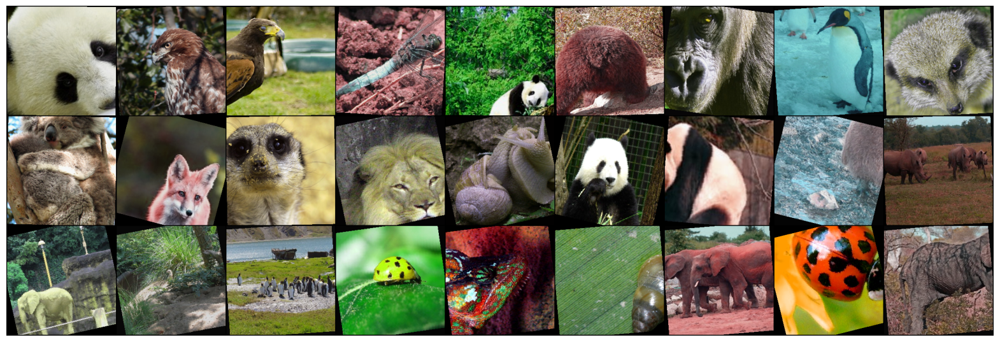

In [15]:
sample_inputs, _ = next(iter(loader_val))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Next, we define ResNet-18:

In [23]:
# define resnet building blocks

class ResidualBlock(nn.Module): 
    def __init__(self, inchannel, outchannel, stride=1): 
        
        super(ResidualBlock, self).__init__() 
        
        self.left = nn.Sequential(Conv2d(inchannel, outchannel, kernel_size=3, 
                                         stride=stride, padding=1, bias=False), 
                                  nn.BatchNorm2d(outchannel), 
                                  nn.ReLU(inplace=True), 
                                  Conv2d(outchannel, outchannel, kernel_size=3, 
                                         stride=1, padding=1, bias=False), 
                                  nn.BatchNorm2d(outchannel)) 
        
        self.shortcut = nn.Sequential() 
        
        if stride != 1 or inchannel != outchannel: 
            
            self.shortcut = nn.Sequential(Conv2d(inchannel, outchannel, 
                                                 kernel_size=1, stride=stride, 
                                                 padding = 0, bias=False), 
                                          nn.BatchNorm2d(outchannel) ) 
            
    def forward(self, x): 
        
        out = self.left(x) 
        
        out += self.shortcut(x) 
        
        out = F.relu(out) 
        
        return out


    
# define resnet

class ResNet(nn.Module):
    
    def __init__(self, ResidualBlock, num_classes = 20):
        
        super(ResNet, self).__init__()
        
        self.inchannel = 16
        self.conv1 = nn.Sequential(Conv2d(3, 16, kernel_size = 3, stride = 1,
                                            padding = 1, bias = False), 
                                  nn.BatchNorm2d(16), 
                                  nn.ReLU())
        
        self.layer1 = self.make_layer(ResidualBlock, 16, 2, stride = 2)
        self.layer2 = self.make_layer(ResidualBlock, 32, 2, stride = 2)
        self.layer3 = self.make_layer(ResidualBlock, 64, 2, stride = 2)
        self.layer4 = self.make_layer(ResidualBlock, 128, 2, stride = 2)
        self.layer5 = self.make_layer(ResidualBlock, 256, 2, stride = 2)
        self.layer6 = self.make_layer(ResidualBlock, 512, 2, stride = 2)
        self.maxpool = MaxPool2d(4)
        
        # Including dropout in the fully connected layer setup
        self.fc = nn.Sequential(
            nn.Dropout(0.2),  # Adjust the dropout rate as needed
            nn.Linear(512, num_classes)
        )
        
    
    def make_layer(self, block, channels, num_blocks, stride):
        
        strides = [stride] + [1] * (num_blocks - 1)
        
        layers = []
        
        for stride in strides:
            
            layers.append(block(self.inchannel, channels, stride))
            
            self.inchannel = channels
            
        return nn.Sequential(*layers)
    
    
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x
    
# please do not change the name of this class
def MyResNet():
    return ResNet(ResidualBlock)

In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns


def confusion(preds, y):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # Plotting the confusion matrix
  cm = confusion_matrix(y.cpu().numpy(), preds.cpu().numpy(), normalize='true')
  fig, ax= plt.subplots(1, 1, figsize=(15,10))
  sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

  # labels, title and ticks
  ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
  ax.set_title('Confusion Matrix');
  ax.xaxis.set_ticklabels(labels, rotation = 70); ax.yaxis.set_ticklabels(labels, rotation=0);
  plt.show()

def incorrect_preds(preds, y, test_img):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # lets see a sample of the images which were classified incorrectly!
  correct = (preds == y).float()
  test_labels_check = correct.cpu().numpy()
  incorrect_indexes = np.where(test_labels_check == 0)

  test_img = test_img.cpu()
  samples = make_grid(denorm(test_img[incorrect_indexes][:9]), nrow=3,
                      padding=2, normalize=False, value_range=None, 
                      scale_each=False, pad_value=0)
  plt.figure(figsize = (20,10))
  plt.title('Incorrectly Classified Instances')
  show(samples)
  labels = np.asarray(labels)
  print('Predicted label',labels[preds[incorrect_indexes].cpu().numpy()[:9]])
  print('True label', labels[y[incorrect_indexes].cpu().numpy()[:9]])
  print('Corresponding images are shown below')

In [25]:
USE_GPU = True
dtype = torch.float32 


if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print(device)
    

print_every = 10
def check_accuracy(loader, model, analysis=False):
    # function for test accuracy on validation and test set
    
    num_correct = 0
    num_samples = 0
    model.eval()  # set model to evaluation mode
    with torch.no_grad():
        for t, (x, y) in enumerate(loader):
            x = x.to(device=device, dtype=dtype)  # move to device
            y = y.to(device=device, dtype=torch.long)
            scores = model(x)
            _, preds = scores.max(1)
            num_correct += (preds == y).sum()
            num_samples += preds.size(0)
            if t == 0 and analysis:
              stack_labels = y
              stack_predicts = preds
            elif analysis:
              stack_labels = torch.cat([stack_labels, y], 0)
              stack_predicts = torch.cat([stack_predicts, preds], 0)
        acc = float(num_correct) / num_samples
        print('Got %d / %d correct of val set (%.2f)' % (num_correct, num_samples, 100 * acc))
        if analysis:
          print('check acc', type(stack_predicts), type(stack_labels))
          confusion(stack_predicts, stack_labels)
          incorrect_preds(preds, y, x)
        return float(acc)

        

def train_part(model, optimizer, epochs=1,scheduler=None):
    """
    Train a model on NaturalImageNet using the PyTorch Module API.
    
    Inputs:
    - model: A PyTorch Module giving the model to train.
    - optimizer: An Optimizer object we will use to train the model
    - epochs: (Optional) A Python integer giving the number of epochs to train for
    
    Returns: Nothing, but prints model accuracies during training.
    """
    model = model.to(device=device)  # move the model parameters to CPU/GPU
    for e in range(epochs):
        for t, (x, y) in enumerate(loader_train):
            model.train()  # put model to training mode
            x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
            y = y.to(device=device, dtype=torch.long)

            scores = model(x)
            loss = F.cross_entropy(scores, y)

            # Zero out all of the gradients for the variables which the optimizer
            # will update.
            optimizer.zero_grad()

            loss.backward()

            # Update the parameters of the model using the gradients
            optimizer.step()


            if t % print_every == 0:
                print('Epoch: %d, Iteration %d, loss = %.4f' % (e, t, loss.item()))

        if scheduler:
            scheduler.step()  # Adjust learning rate
        check_accuracy(loader_val, model)
                

cuda:0



### Random Hyperparameter Exploration


Total number of parameters is: 11204164
Epoch: 0, Iteration 0, loss = 6.3425
Epoch: 0, Iteration 10, loss = 6.2143
Epoch: 0, Iteration 20, loss = 3.4663
Epoch: 0, Iteration 30, loss = 3.3549
Epoch: 0, Iteration 40, loss = 3.3343
Epoch: 0, Iteration 50, loss = 3.0993
Epoch: 0, Iteration 60, loss = 3.0851
Epoch: 0, Iteration 70, loss = 3.0771
Epoch: 0, Iteration 80, loss = 3.3015
Epoch: 0, Iteration 90, loss = 2.9793
Epoch: 0, Iteration 100, loss = 3.5014
Epoch: 0, Iteration 110, loss = 2.9112
Epoch: 0, Iteration 120, loss = 3.0009
Epoch: 0, Iteration 130, loss = 2.8373
Epoch: 0, Iteration 140, loss = 2.8209
Got 326 / 1998 correct of val set (16.32)
Epoch: 1, Iteration 0, loss = 2.9171
Epoch: 1, Iteration 10, loss = 3.4802
Epoch: 1, Iteration 20, loss = 2.8823
Epoch: 1, Iteration 30, loss = 2.8443
Epoch: 1, Iteration 40, loss = 2.6462
Epoch: 1, Iteration 50, loss = 2.8130
Epoch: 1, Iteration 60, loss = 2.7704
Epoch: 1, Iteration 70, loss = 2.8186
Epoch: 1, Iteration 80, loss = 2.8484
Epo

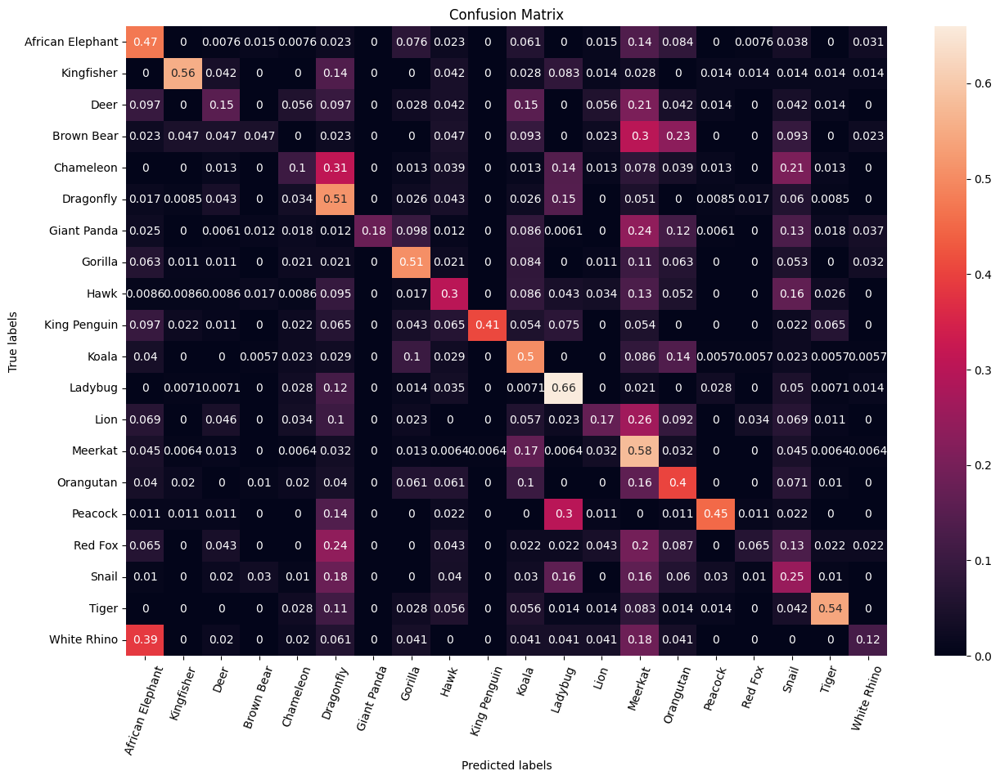

Predicted label ['Dragonfly' 'Gorilla' 'Meerkat' 'Ladybug' 'Ladybug' 'Brown Bear'
 'Dragonfly' 'Meerkat' 'Dragonfly']
True label ['Deer' 'King Penguin' 'Giant Panda' 'Kingfisher' 'Hawk' 'Koala' 'Koala'
 'Koala' 'Ladybug']
Corresponding images are shown below


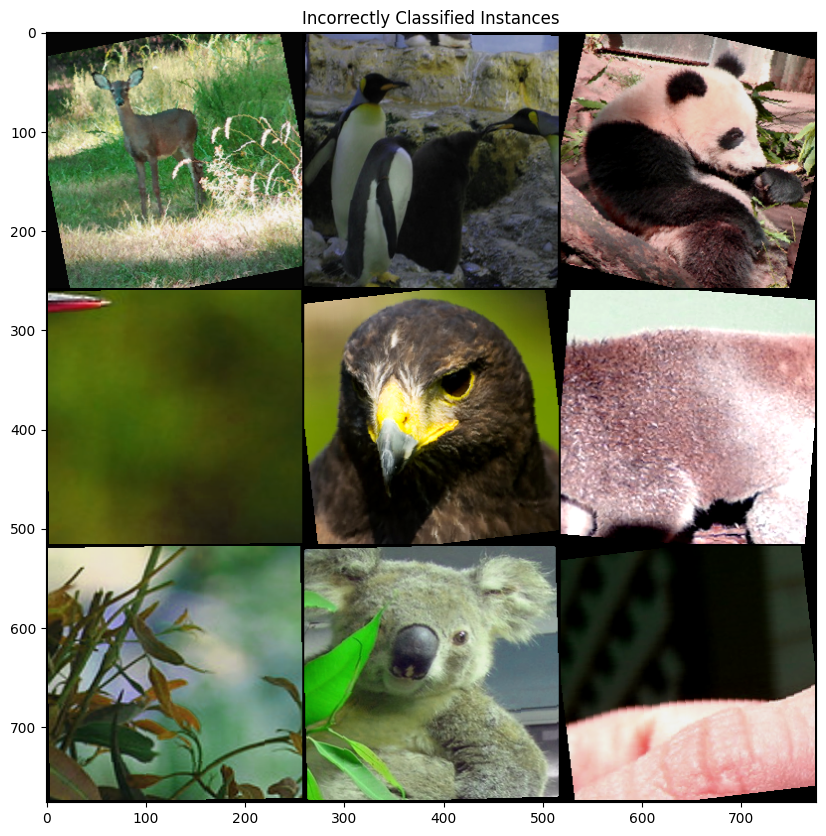

In [21]:
# Random exploration
model = MyResNet()
optimizer = optim.Adamax(model.parameters(), lr=0.01, weight_decay=1e-5) #Trying multiple values for lr and weight decay

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

train_part(model, optimizer, epochs = 10)


# report test set accuracy
check_accuracy(loader_val, model, analysis=True)


# save the model
torch.save(model.state_dict(), 'model.pt')*


### Bayesian Hyperparameter Optimisation - Optuna

Total number of parameters is: 11204164
Epoch: 0, Iteration 0, loss = 4.3511
Epoch: 0, Iteration 10, loss = 3.0043
Epoch: 0, Iteration 20, loss = 3.1502
Epoch: 0, Iteration 30, loss = 3.1545
Epoch: 0, Iteration 40, loss = 2.7777
Epoch: 0, Iteration 50, loss = 3.1410
Epoch: 0, Iteration 60, loss = 2.7340
Epoch: 0, Iteration 70, loss = 2.7169
Epoch: 0, Iteration 80, loss = 2.8973
Epoch: 0, Iteration 90, loss = 2.5924
Epoch: 0, Iteration 100, loss = 2.8170
Epoch: 0, Iteration 110, loss = 2.6690
Epoch: 0, Iteration 120, loss = 3.0117
Epoch: 0, Iteration 130, loss = 2.6299
Epoch: 0, Iteration 140, loss = 2.7681
Got 480 / 1998 correct of val set (24.02)
Epoch: 1, Iteration 0, loss = 2.4485
Epoch: 1, Iteration 10, loss = 2.5583
Epoch: 1, Iteration 20, loss = 2.5592
Epoch: 1, Iteration 30, loss = 2.6289
Epoch: 1, Iteration 40, loss = 2.3261
Epoch: 1, Iteration 50, loss = 2.4868
Epoch: 1, Iteration 60, loss = 2.4719
Epoch: 1, Iteration 70, loss = 2.4052
Epoch: 1, Iteration 80, loss = 2.4303
Epo

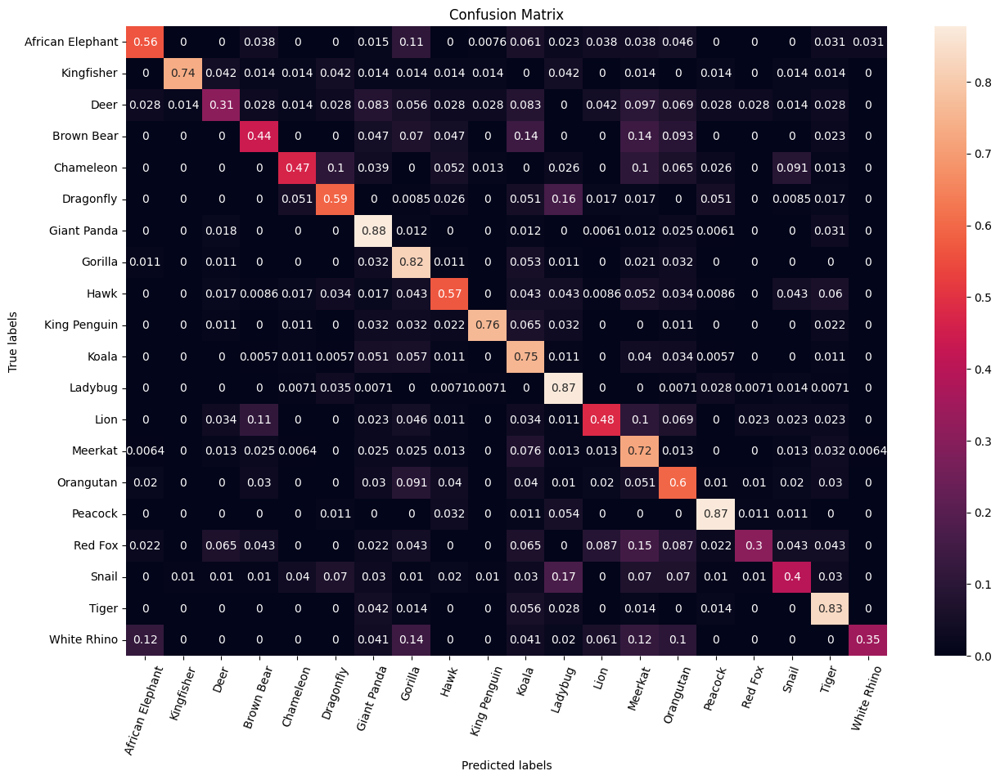

Predicted label ['Meerkat' 'Gorilla' 'Brown Bear' 'Tiger' 'Ladybug' 'Dragonfly' 'Koala'
 'Koala' 'Koala']
True label ['Deer' 'White Rhino' 'Lion' 'Snail' 'Meerkat' 'Chameleon' 'Meerkat'
 'Dragonfly' 'Brown Bear']
Corresponding images are shown below


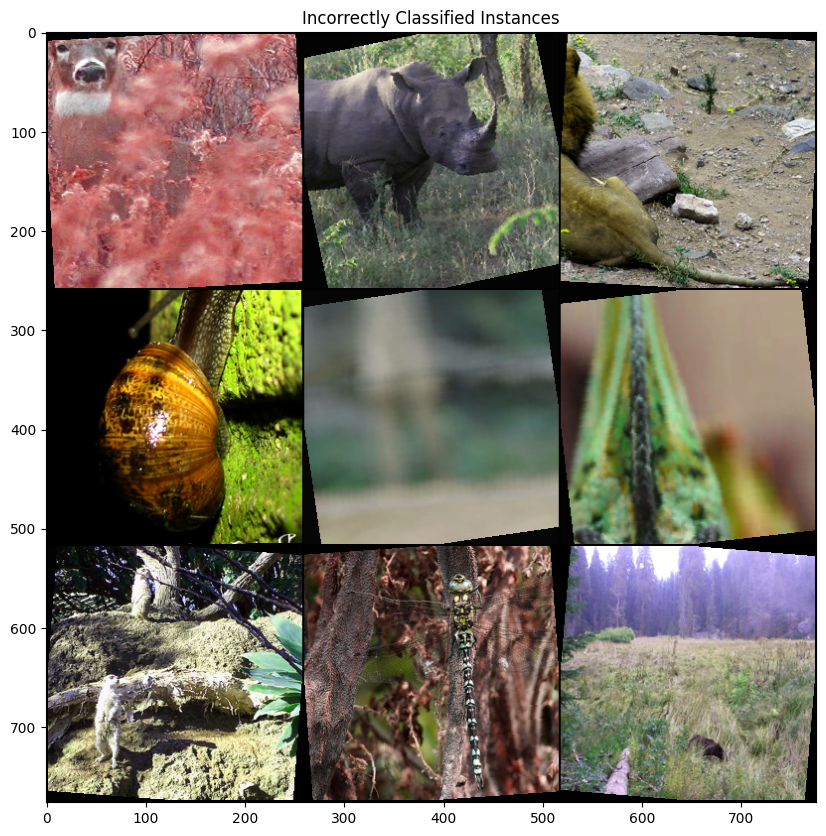

In [26]:
# Using Optimised Hyperparameters from Optuna
model = MyResNet()
optimizer = optim.AdamW(model.parameters(), lr=0.0009, weight_decay=0.00039) #lr original = 0.0001
scheduler = StepLR(optimizer, step_size=6, gamma=0.7)  # Define scheduler

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

train_part(model, optimizer, epochs = 15, scheduler=scheduler)


# report test set accuracy
check_accuracy(loader_val, model, analysis=True)


# save the model
torch.save(model.state_dict(), 'model.pt')

In [47]:
import optuna


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dtype = torch.float  # Define the default data type for tensors
print(device)
def objective(trial):
    # Hyperparameters to optimize
    lr = trial.suggest_float('lr', 1e-5, 1e-2)
    weight_decay = trial.suggest_float('weight_decay', 1e-7, 1e-3)
    optimizer_name = trial.suggest_categorical('optimizer', ['RMSprop', 'AdamW', 'SGD'])
    step_size = trial.suggest_int('step_size', 1, 10)
    gamma = trial.suggest_float('gamma', 0.1, 0.9)

    # Print current hyperparameters
    print(f"Trial {trial.number}:")
    print(f"Learning rate: {lr}, Weight decay: {weight_decay}, Optimizer: {optimizer_name}, Step size: {step_size}, Gamma: {gamma}")
    
    model = MyResNet().to(device)
    optimizer = getattr(optim, optimizer_name)(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = StepLR(optimizer, step_size=step_size, gamma=gamma)
    
    # Wrap your existing training logic here
    for epoch in range(10):  
        for t, (x, y) in enumerate(loader_train):
            model.train()
            x = x.to(device=device, dtype=dtype)
            y = y.to(device=device, dtype=torch.long)

            scores = model(x)
            loss = F.cross_entropy(scores, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Optional: Add logging or early stopping logic here
            if t % print_every == 0:
                print('Epoch: %d, Iteration %d, loss = %.4f' % (epoch, t, loss.item()))

        scheduler.step()
        val_accuracy = check_accuracy(loader_val, model)
    
    return val_accuracy  # Objective to maximize

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)  # Adjust the number of trials as needed

print("Best hyperparameters: ", study.best_trial.params)


[I 2024-02-04 04:08:10,589] A new study created in memory with name: no-name-b0c8be99-7531-4cb6-bb05-0e04d618fbf3


cuda
Trial 0:
Learning rate: 0.006548491119208217, Weight decay: 0.0006885426883869346, Optimizer: RMSprop, Step size: 9, Gamma: 0.4280163711671723
Epoch: 0, Iteration 0, loss = 4.5077
Epoch: 0, Iteration 10, loss = 4.3932
Epoch: 0, Iteration 20, loss = 2.9236
Epoch: 0, Iteration 30, loss = 3.0215
Epoch: 0, Iteration 40, loss = 3.7985
Epoch: 0, Iteration 50, loss = 4.0484
Epoch: 0, Iteration 60, loss = 2.9299
Epoch: 0, Iteration 70, loss = 2.8841
Epoch: 0, Iteration 80, loss = 3.6466
Epoch: 0, Iteration 90, loss = 2.9578
Epoch: 0, Iteration 100, loss = 3.5521
Epoch: 0, Iteration 110, loss = 2.8860
Epoch: 0, Iteration 120, loss = 2.8340
Epoch: 0, Iteration 130, loss = 3.3663
Epoch: 0, Iteration 140, loss = 3.1743
Got 190 / 1998 correct of val set (9.51)
Epoch: 1, Iteration 0, loss = 3.7081
Epoch: 1, Iteration 10, loss = 4.3139
Epoch: 1, Iteration 20, loss = 2.9395
Epoch: 1, Iteration 30, loss = 2.9862
Epoch: 1, Iteration 40, loss = 2.9014
Epoch: 1, Iteration 50, loss = 2.8723
Epoch: 1, 

[I 2024-02-04 04:29:32,643] Trial 0 finished with value: 0.28378378378378377 and parameters: {'lr': 0.006548491119208217, 'weight_decay': 0.0006885426883869346, 'optimizer': 'RMSprop', 'step_size': 9, 'gamma': 0.4280163711671723}. Best is trial 0 with value: 0.28378378378378377.


Got 567 / 1998 correct of val set (28.38)
Trial 1:
Learning rate: 0.005354901497926727, Weight decay: 0.0003212600771806677, Optimizer: RMSprop, Step size: 9, Gamma: 0.7736609987920293
Epoch: 0, Iteration 0, loss = 5.2714
Epoch: 0, Iteration 10, loss = 7.4704
Epoch: 0, Iteration 20, loss = 3.7407
Epoch: 0, Iteration 30, loss = 3.1458
Epoch: 0, Iteration 40, loss = 2.9775
Epoch: 0, Iteration 50, loss = 3.0870
Epoch: 0, Iteration 60, loss = 3.0022
Epoch: 0, Iteration 70, loss = 3.2624
Epoch: 0, Iteration 80, loss = 3.4785
Epoch: 0, Iteration 90, loss = 2.9540
Epoch: 0, Iteration 100, loss = 3.2624
Epoch: 0, Iteration 110, loss = 3.0356
Epoch: 0, Iteration 120, loss = 2.8802
Epoch: 0, Iteration 130, loss = 3.5281
Epoch: 0, Iteration 140, loss = 2.7688
Got 259 / 1998 correct of val set (12.96)
Epoch: 1, Iteration 0, loss = 3.0213
Epoch: 1, Iteration 10, loss = 2.7993
Epoch: 1, Iteration 20, loss = 3.2920
Epoch: 1, Iteration 30, loss = 2.9475
Epoch: 1, Iteration 40, loss = 2.8228
Epoch: 1, 

[I 2024-02-04 04:50:55,731] Trial 1 finished with value: 0.3588588588588589 and parameters: {'lr': 0.005354901497926727, 'weight_decay': 0.0003212600771806677, 'optimizer': 'RMSprop', 'step_size': 9, 'gamma': 0.7736609987920293}. Best is trial 1 with value: 0.3588588588588589.


Got 717 / 1998 correct of val set (35.89)
Trial 2:
Learning rate: 0.009839230418497104, Weight decay: 0.0008796717810195323, Optimizer: AdamW, Step size: 2, Gamma: 0.6861728254118467
Epoch: 0, Iteration 0, loss = 4.6168
Epoch: 0, Iteration 10, loss = 4.2580
Epoch: 0, Iteration 20, loss = 5.2061
Epoch: 0, Iteration 30, loss = 4.3453
Epoch: 0, Iteration 40, loss = 2.9627
Epoch: 0, Iteration 50, loss = 2.9311
Epoch: 0, Iteration 60, loss = 2.9929
Epoch: 0, Iteration 70, loss = 3.2252
Epoch: 0, Iteration 80, loss = 2.9884
Epoch: 0, Iteration 90, loss = 2.9018
Epoch: 0, Iteration 100, loss = 3.2020
Epoch: 0, Iteration 110, loss = 2.8645
Epoch: 0, Iteration 120, loss = 2.8322
Epoch: 0, Iteration 130, loss = 3.1177
Epoch: 0, Iteration 140, loss = 3.1135
Got 151 / 1998 correct of val set (7.56)
Epoch: 1, Iteration 0, loss = 2.7850
Epoch: 1, Iteration 10, loss = 3.4775
Epoch: 1, Iteration 20, loss = 3.1312
Epoch: 1, Iteration 30, loss = 2.8271
Epoch: 1, Iteration 40, loss = 2.7444
Epoch: 1, Ite

[I 2024-02-04 05:12:15,836] Trial 2 finished with value: 0.3908908908908909 and parameters: {'lr': 0.009839230418497104, 'weight_decay': 0.0008796717810195323, 'optimizer': 'AdamW', 'step_size': 2, 'gamma': 0.6861728254118467}. Best is trial 2 with value: 0.3908908908908909.


Got 781 / 1998 correct of val set (39.09)
Trial 3:
Learning rate: 0.004590985728270174, Weight decay: 0.0004721793632937394, Optimizer: SGD, Step size: 2, Gamma: 0.7722463650818494
Epoch: 0, Iteration 0, loss = 4.2720
Epoch: 0, Iteration 10, loss = 3.6697
Epoch: 0, Iteration 20, loss = 3.2872
Epoch: 0, Iteration 30, loss = 3.4761
Epoch: 0, Iteration 40, loss = 3.2595
Epoch: 0, Iteration 50, loss = 3.2216
Epoch: 0, Iteration 60, loss = 3.0929
Epoch: 0, Iteration 70, loss = 3.0570
Epoch: 0, Iteration 80, loss = 3.0783
Epoch: 0, Iteration 90, loss = 3.0873
Epoch: 0, Iteration 100, loss = 2.9713
Epoch: 0, Iteration 110, loss = 2.7673
Epoch: 0, Iteration 120, loss = 2.7068
Epoch: 0, Iteration 130, loss = 2.7548
Epoch: 0, Iteration 140, loss = 3.0590
Got 336 / 1998 correct of val set (16.82)
Epoch: 1, Iteration 0, loss = 2.9231
Epoch: 1, Iteration 10, loss = 2.6206
Epoch: 1, Iteration 20, loss = 2.8614
Epoch: 1, Iteration 30, loss = 2.9221
Epoch: 1, Iteration 40, loss = 2.7737
Epoch: 1, Iter

[I 2024-02-04 05:33:28,884] Trial 3 finished with value: 0.34434434434434436 and parameters: {'lr': 0.004590985728270174, 'weight_decay': 0.0004721793632937394, 'optimizer': 'SGD', 'step_size': 2, 'gamma': 0.7722463650818494}. Best is trial 2 with value: 0.3908908908908909.


Got 688 / 1998 correct of val set (34.43)
Trial 4:
Learning rate: 0.006508727187668666, Weight decay: 0.00039009884507961644, Optimizer: AdamW, Step size: 6, Gamma: 0.7043887357513515
Epoch: 0, Iteration 0, loss = 4.4446
Epoch: 0, Iteration 10, loss = 3.1579
Epoch: 0, Iteration 20, loss = 3.6645
Epoch: 0, Iteration 30, loss = 4.7477
Epoch: 0, Iteration 40, loss = 4.0962
Epoch: 0, Iteration 50, loss = 3.0850
Epoch: 0, Iteration 60, loss = 2.9666
Epoch: 0, Iteration 70, loss = 2.8647
Epoch: 0, Iteration 80, loss = 3.4668
Epoch: 0, Iteration 90, loss = 3.0212
Epoch: 0, Iteration 100, loss = 2.9900
Epoch: 0, Iteration 110, loss = 2.8101
Epoch: 0, Iteration 120, loss = 2.8032
Epoch: 0, Iteration 130, loss = 2.8294
Epoch: 0, Iteration 140, loss = 3.2354
Got 283 / 1998 correct of val set (14.16)
Epoch: 1, Iteration 0, loss = 2.6823
Epoch: 1, Iteration 10, loss = 2.6215
Epoch: 1, Iteration 20, loss = 2.7483
Epoch: 1, Iteration 30, loss = 2.9300
Epoch: 1, Iteration 40, loss = 3.0764
Epoch: 1, I

[I 2024-02-04 05:54:51,354] Trial 4 finished with value: 0.38788788788788786 and parameters: {'lr': 0.006508727187668666, 'weight_decay': 0.00039009884507961644, 'optimizer': 'AdamW', 'step_size': 6, 'gamma': 0.7043887357513515}. Best is trial 2 with value: 0.3908908908908909.


Got 775 / 1998 correct of val set (38.79)
Trial 5:
Learning rate: 0.0009073874189055256, Weight decay: 0.00038986148169298647, Optimizer: AdamW, Step size: 6, Gamma: 0.7080196848601457
Epoch: 0, Iteration 0, loss = 4.6075
Epoch: 0, Iteration 10, loss = 3.3115
Epoch: 0, Iteration 20, loss = 3.5602
Epoch: 0, Iteration 30, loss = 2.9358
Epoch: 0, Iteration 40, loss = 2.8964
Epoch: 0, Iteration 50, loss = 3.0626
Epoch: 0, Iteration 60, loss = 3.1990
Epoch: 0, Iteration 70, loss = 2.9972
Epoch: 0, Iteration 80, loss = 2.8773
Epoch: 0, Iteration 90, loss = 2.7037
Epoch: 0, Iteration 100, loss = 2.9035
Epoch: 0, Iteration 110, loss = 2.5545
Epoch: 0, Iteration 120, loss = 2.7654
Epoch: 0, Iteration 130, loss = 2.7758
Epoch: 0, Iteration 140, loss = 2.5220
Got 402 / 1998 correct of val set (20.12)
Epoch: 1, Iteration 0, loss = 2.6706
Epoch: 1, Iteration 10, loss = 2.6685
Epoch: 1, Iteration 20, loss = 2.7046
Epoch: 1, Iteration 30, loss = 2.4931
Epoch: 1, Iteration 40, loss = 2.5480
Epoch: 1, 

[I 2024-02-04 06:16:07,470] Trial 5 finished with value: 0.5630630630630631 and parameters: {'lr': 0.0009073874189055256, 'weight_decay': 0.00038986148169298647, 'optimizer': 'AdamW', 'step_size': 6, 'gamma': 0.7080196848601457}. Best is trial 5 with value: 0.5630630630630631.


Got 1125 / 1998 correct of val set (56.31)
Trial 6:
Learning rate: 0.009255860423679482, Weight decay: 9.049049336144143e-05, Optimizer: RMSprop, Step size: 7, Gamma: 0.24523406382317703
Epoch: 0, Iteration 0, loss = 4.1604
Epoch: 0, Iteration 10, loss = 4.5422
Epoch: 0, Iteration 20, loss = 3.4637
Epoch: 0, Iteration 30, loss = 3.3356
Epoch: 0, Iteration 40, loss = 2.8907
Epoch: 0, Iteration 50, loss = 3.4304
Epoch: 0, Iteration 60, loss = 3.3022
Epoch: 0, Iteration 70, loss = 2.9417
Epoch: 0, Iteration 80, loss = 3.3653
Epoch: 0, Iteration 90, loss = 2.8882
Epoch: 0, Iteration 100, loss = 3.0419
Epoch: 0, Iteration 110, loss = 3.3512
Epoch: 0, Iteration 120, loss = 2.8356
Epoch: 0, Iteration 130, loss = 3.0384
Epoch: 0, Iteration 140, loss = 2.9196
Got 234 / 1998 correct of val set (11.71)
Epoch: 1, Iteration 0, loss = 2.7907
Epoch: 1, Iteration 10, loss = 2.8673
Epoch: 1, Iteration 20, loss = 2.8121
Epoch: 1, Iteration 30, loss = 2.8127
Epoch: 1, Iteration 40, loss = 2.7390
Epoch: 1

[I 2024-02-04 06:37:22,160] Trial 6 finished with value: 0.3258258258258258 and parameters: {'lr': 0.009255860423679482, 'weight_decay': 9.049049336144143e-05, 'optimizer': 'RMSprop', 'step_size': 7, 'gamma': 0.24523406382317703}. Best is trial 5 with value: 0.5630630630630631.


Got 651 / 1998 correct of val set (32.58)
Trial 7:
Learning rate: 0.005938571234301589, Weight decay: 0.00032885931047468505, Optimizer: RMSprop, Step size: 8, Gamma: 0.4800538252494748
Epoch: 0, Iteration 0, loss = 4.2996
Epoch: 0, Iteration 10, loss = 3.8951
Epoch: 0, Iteration 20, loss = 4.0522
Epoch: 0, Iteration 30, loss = 2.9164
Epoch: 0, Iteration 40, loss = 3.2322
Epoch: 0, Iteration 50, loss = 3.1689
Epoch: 0, Iteration 60, loss = 3.0188
Epoch: 0, Iteration 70, loss = 3.3877
Epoch: 0, Iteration 80, loss = 2.8310
Epoch: 0, Iteration 90, loss = 3.7550
Epoch: 0, Iteration 100, loss = 3.3368
Epoch: 0, Iteration 110, loss = 2.9856
Epoch: 0, Iteration 120, loss = 2.8657
Epoch: 0, Iteration 130, loss = 3.1296
Epoch: 0, Iteration 140, loss = 2.8707
Got 251 / 1998 correct of val set (12.56)
Epoch: 1, Iteration 0, loss = 3.0312
Epoch: 1, Iteration 10, loss = 3.1075
Epoch: 1, Iteration 20, loss = 2.6823
Epoch: 1, Iteration 30, loss = 2.8875
Epoch: 1, Iteration 40, loss = 2.9492
Epoch: 1,

[I 2024-02-04 06:58:36,958] Trial 7 finished with value: 0.31931931931931934 and parameters: {'lr': 0.005938571234301589, 'weight_decay': 0.00032885931047468505, 'optimizer': 'RMSprop', 'step_size': 8, 'gamma': 0.4800538252494748}. Best is trial 5 with value: 0.5630630630630631.


Got 638 / 1998 correct of val set (31.93)
Trial 8:
Learning rate: 0.008656157496874005, Weight decay: 4.587320428982327e-05, Optimizer: RMSprop, Step size: 2, Gamma: 0.4501482278291469
Epoch: 0, Iteration 0, loss = 4.5161
Epoch: 0, Iteration 10, loss = 4.7138
Epoch: 0, Iteration 20, loss = 3.0740
Epoch: 0, Iteration 30, loss = 3.9015
Epoch: 0, Iteration 40, loss = 3.3442
Epoch: 0, Iteration 50, loss = 3.6749
Epoch: 0, Iteration 60, loss = 3.1610
Epoch: 0, Iteration 70, loss = 3.0685
Epoch: 0, Iteration 80, loss = 2.9802
Epoch: 0, Iteration 90, loss = 2.9760
Epoch: 0, Iteration 100, loss = 3.1626
Epoch: 0, Iteration 110, loss = 3.1791
Epoch: 0, Iteration 120, loss = 2.9950
Epoch: 0, Iteration 130, loss = 3.1073
Epoch: 0, Iteration 140, loss = 4.2480
Got 157 / 1998 correct of val set (7.86)
Epoch: 1, Iteration 0, loss = 2.9623
Epoch: 1, Iteration 10, loss = 3.0285
Epoch: 1, Iteration 20, loss = 3.0109
Epoch: 1, Iteration 30, loss = 3.0708
Epoch: 1, Iteration 40, loss = 2.9773
Epoch: 1, I

[I 2024-02-04 07:20:05,536] Trial 8 finished with value: 0.3173173173173173 and parameters: {'lr': 0.008656157496874005, 'weight_decay': 4.587320428982327e-05, 'optimizer': 'RMSprop', 'step_size': 2, 'gamma': 0.4501482278291469}. Best is trial 5 with value: 0.5630630630630631.


Got 634 / 1998 correct of val set (31.73)
Trial 9:
Learning rate: 0.002771150235355999, Weight decay: 0.00024585208347029997, Optimizer: SGD, Step size: 7, Gamma: 0.20454007035376653
Epoch: 0, Iteration 0, loss = 3.7995
Epoch: 0, Iteration 10, loss = 3.3843
Epoch: 0, Iteration 20, loss = 3.4466
Epoch: 0, Iteration 30, loss = 3.1678
Epoch: 0, Iteration 40, loss = 3.0695
Epoch: 0, Iteration 50, loss = 3.2750
Epoch: 0, Iteration 60, loss = 3.3854
Epoch: 0, Iteration 70, loss = 3.0461
Epoch: 0, Iteration 80, loss = 3.3016
Epoch: 0, Iteration 90, loss = 3.4686
Epoch: 0, Iteration 100, loss = 3.2401
Epoch: 0, Iteration 110, loss = 3.0740
Epoch: 0, Iteration 120, loss = 3.1123
Epoch: 0, Iteration 130, loss = 3.0402
Epoch: 0, Iteration 140, loss = 2.8417
Got 282 / 1998 correct of val set (14.11)
Epoch: 1, Iteration 0, loss = 3.2292
Epoch: 1, Iteration 10, loss = 2.9959
Epoch: 1, Iteration 20, loss = 2.9438
Epoch: 1, Iteration 30, loss = 2.9296
Epoch: 1, Iteration 40, loss = 2.8514
Epoch: 1, It

[I 2024-02-04 07:41:23,039] Trial 9 finished with value: 0.3113113113113113 and parameters: {'lr': 0.002771150235355999, 'weight_decay': 0.00024585208347029997, 'optimizer': 'SGD', 'step_size': 7, 'gamma': 0.20454007035376653}. Best is trial 5 with value: 0.5630630630630631.


Got 622 / 1998 correct of val set (31.13)
Best hyperparameters:  {'lr': 0.0009073874189055256, 'weight_decay': 0.00038986148169298647, 'optimizer': 'AdamW', 'step_size': 6, 'gamma': 0.7080196848601457}


---

<!-- BEGIN QUESTION -->

### Network Performance

Run the code below when all engineering decisions have been made, do not overfit to the test set!

**Note that** this will appear in the output, and be checked by markers (so ensure it is present in the auto-export)

Got 1425 / 2000 correct of val set (71.25)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


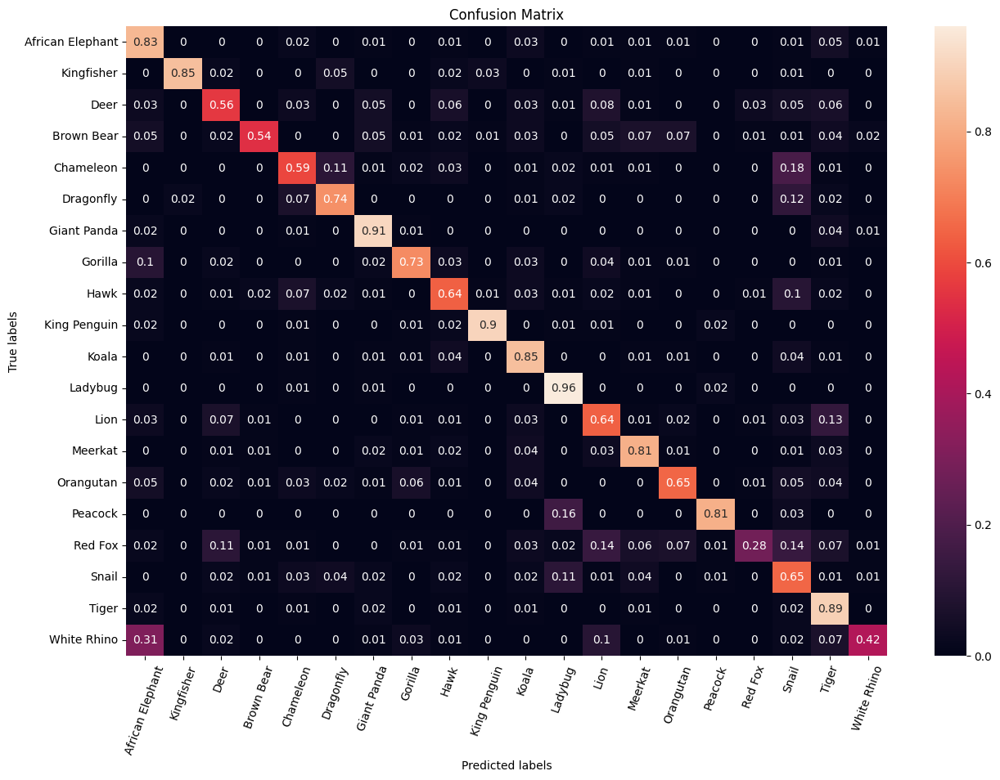

Predicted label ['Snail' 'Meerkat' 'African Elephant' 'Hawk' 'Tiger' 'Lion' 'Deer'
 'African Elephant' 'Snail']
True label ['Hawk' 'Red Fox' 'White Rhino' 'Snail' 'Giant Panda' 'Red Fox' 'Snail'
 'White Rhino' 'Dragonfly']
Corresponding images are shown below


0.7125

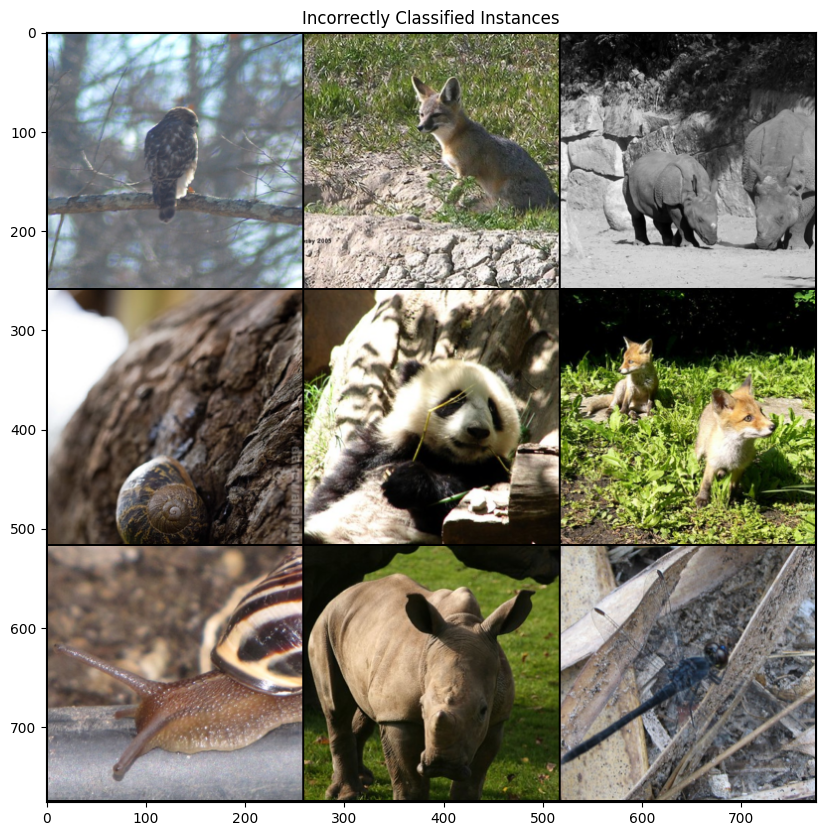

In [20]:
# Run once your have trained your final model
check_accuracy(loader_test, model, analysis=True)

___

### Hyperparameter Search:

In my experience, while a random hyperparameter search did yield a respectable improvement in my model's accuracy, reaching up to 38% on validation dataset, employing Optuna for a more deliberate and expansive exploration of the hyperparameter space led to even better performance, pushing the accuracy to 65% on validation dataset and 71% on test dataset. This increment highlighted Optuna's effectiveness in systematically navigating through the hyperparameters, optimizing them in a way that random search couldn't match. However, this boost in accuracy came at the cost of additional time spent on the hyperparameter search.

The trade-off between the time invested in the search process and the accuracy gains became quite apparent. Optuna's approach, which may include techniques such as Bayesian optimization, tree-structured Parzen estimators (TPE), or even pruning strategies to eliminate unpromising trials early, indeed facilitated higher accuracy levels but required a more substantial time commitment due to its thorough exploration. From my perspective, the extra computational time and resources spent were justified by the significant improvement in performance, underscoring the value of using advanced hyperparameter optimization frameworks like Optuna for complex models and large datasets where maximizing accuracy is paramount. 

This experience underscores a common trade-off in hyperparameter optimization: the balance between accuracy gains and the computational time invested in the search process. The systematic exploration strategies employed by Optuna, while time-consuming, offer a clear pathway to achieving higher model accuracy, making the investment worthwhile for tasks where performance is critical.

---

### Engineering Decisions 

To enhance my deep learning model's performance, I made several engineering decisions that significantly improved the baseline results. 

- **Data Augmentation**: I introduced random rotations, flippings and color jittering to the training data. This increased the diversity of the training dataset, enabling the model to learn more generalized features. For instance, the model became better at recognizing animals in various orientations and lighting conditions, which was reflected in a noticeable improvement in accuracy on the validation set.

- **Learning Rate Scheduler**: Implementing the StepLR scheduler allowed for the dynamic adjustment of the learning rate. Initially, a higher learning rate helped in making rapid progress in the loss landscape, and using optuna helped in fine-tuning the model parameters. This strategy led to a more stable convergence and prevented the model from getting stuck in local minima, enhancing overall performance.

- **Dropout and Regularization**: By adding dropout layers and applying L2 regularization, I managed to reduce overfitting significantly. This was evident as the gap between training and validation accuracy decreased, indicating that the model was generalizing better to unseen data.

- **Optimizer Selection**: Switching to AdamW from a basic SGD optimizer or Adamax made a substantial difference. AdamW's handling of weight decay improved the training dynamics, leading to faster convergence and higher accuracy. This change alone boosted the model's performance by a few percentage points on the validation dataset.

- **Batch Size Tuning**: I experimented with different batch sizes and found that a smaller batch size provided a beneficial regularization effect, improving model generalization. Moreover, it allowed for more frequent updates, which helped in navigating the loss landscape more effectively.

- **Hyperparameter Optimization**: Using Optuna for systematic hyperparameter tuning, I identified an optimal set of hyperparameters, including the learning rate and weight decay, which significantly enhanced the model's validation performance. This systematic approach was more effective than manual tuning, as evidenced by a clear improvement in the validation accuracy.

These engineering decisions collectively addressed key challenges in training deep learning models, such as overfitting and underfitting, and played a crucial role in enhancing the model's ability to generalize. By carefully optimizing the data processing, model architecture, and training process, I achieved a robust model that delivered superior performance on both the training and unseen test data.

---

### Out of distribution evaluation

Lets see how your trained model performs when evaluated on cartoons of the 20 animal classes. 

Evaluating a model trained on realistic animal images on cartoons likely results in decreased performance due to a significant shift in feature distribution between the realistic and cartoon domains. Cartoons are stylized representations with different textures, colors, and often exaggerated features, which diverge from the real images the model was trained on. The model's learned patterns from real images do not directly translate to cartoons, leading to misclassifications.

To improve performance on cartoon images, fine-tuning the model with a small labeled set of cartoon data could be effective. This method allows the model to adjust to the new domain by learning cartoon-specific features while leveraging the general features learned from the realistic images. Fine-tuning bridges the gap between the feature distributions of the two domains, enhancing the model's ability to generalize across vastly different visual representations.

In [38]:
ON_COLAB = False

!wget https://zenodo.org/records/10424022/files/cartoons.zip?download=1

if ON_COLAB:
    !unzip /content/cartoons.zip?download=1 > /dev/null

else:
    !unzip cartoons.zip?download=1 > /dev/null

--2024-02-04 03:54:41--  https://zenodo.org/records/10424022/files/cartoons.zip?download=1
Resolving zenodo.org (zenodo.org)... 2001:1458:d00:3b::100:200, 2001:1458:d00:3a::100:33a, 2001:1458:d00:9::100:195, ...
Connecting to zenodo.org (zenodo.org)|2001:1458:d00:3b::100:200|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1737267 (1.7M) [application/octet-stream]
Saving to: ‘cartoons.zip?download=1.1’

cartoons.zip?downlo 100%[===================>]   1.66M  --.-KB/s    in 0.1s    

2024-02-04 03:54:42 (12.1 MB/s) - ‘cartoons.zip?download=1.1’ saved [1737267/1737267]

replace cartoons/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [31]:
mean = torch.Tensor([0.485, 0.456, 0.406]) # assuming same dist as imagenet
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]

    )
cartoon_path = ('/content/' if ON_COLAB else '') + 'cartoons'
print(cartoon_path)

cartoon_dataset = datasets.ImageFolder(cartoon_path, transform=transform)

print(len(cartoon_dataset))

batch_size = 128

cartoon_loader = DataLoader(cartoon_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

cartoons
400


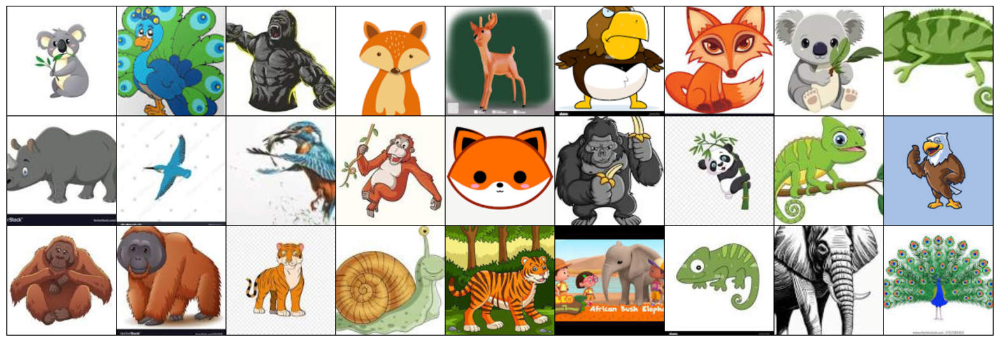

In [32]:
sample_inputs, _ = next(iter(cartoon_loader))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)

plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Got 99 / 400 correct of val set (24.75)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


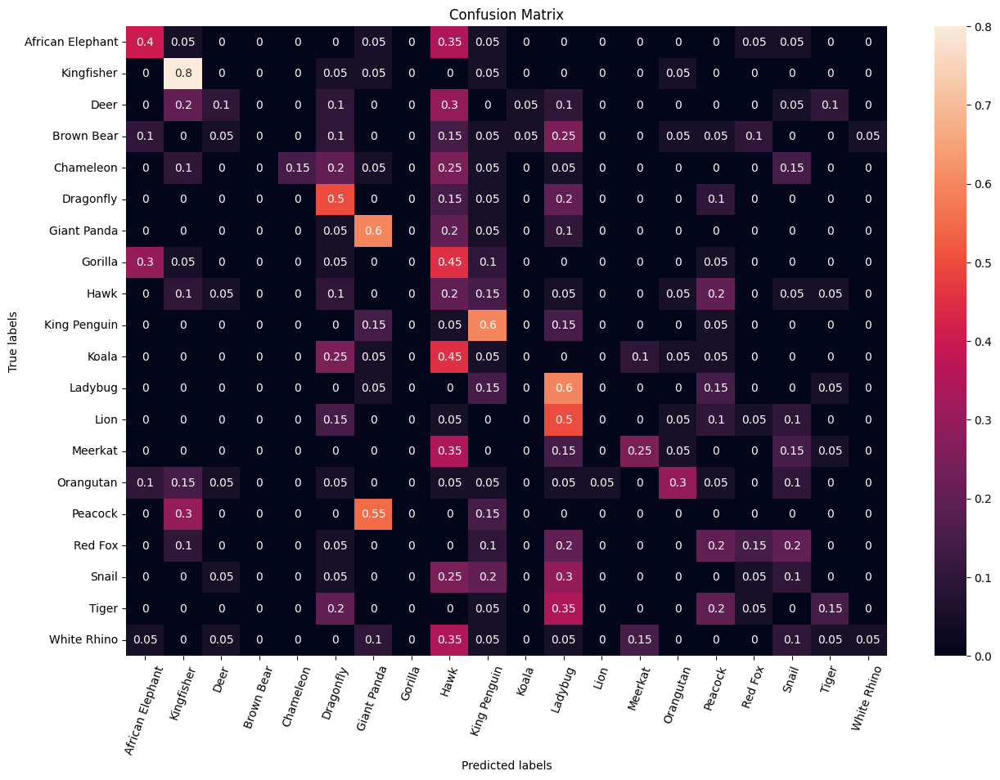

Predicted label ['African Elephant' 'African Elephant' 'Peacock' 'King Penguin' 'Hawk'
 'Dragonfly' 'King Penguin' 'Giant Panda' 'Dragonfly']
True label ['Gorilla' 'Brown Bear' 'King Penguin' 'Hawk' 'African Elephant' 'Koala'
 'Orangutan' 'Peacock' 'Brown Bear']
Corresponding images are shown below


0.2475

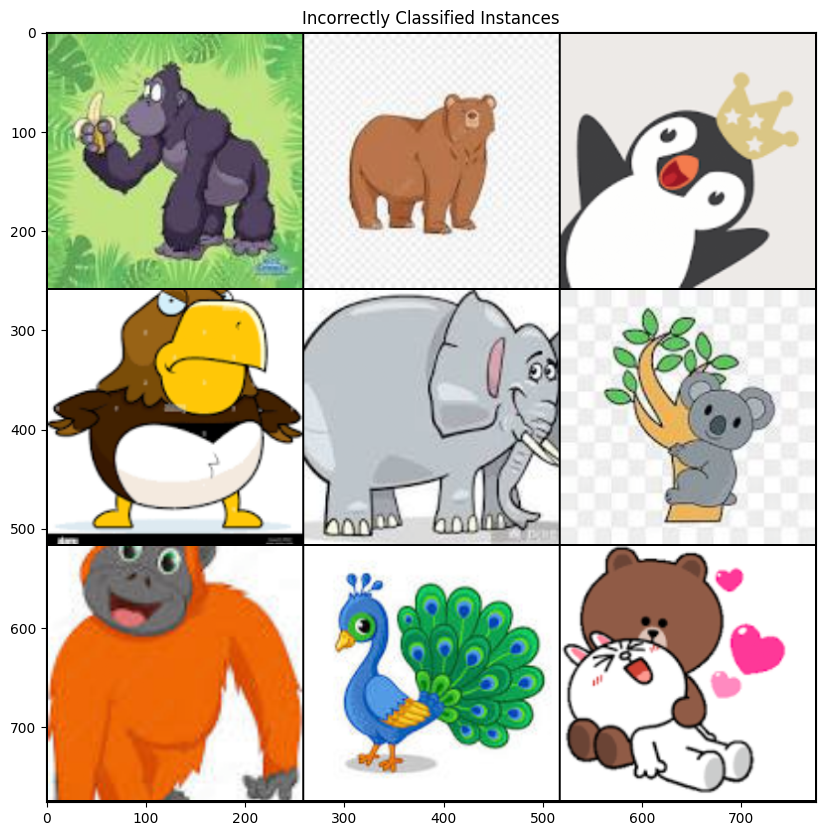

In [33]:
check_accuracy(cartoon_loader, model, analysis=True)

## Part 3 

The code provided below will allow you to visualise the feature maps computed by different layers of your network. Run the code (install matplotlib if necessary) and **answer the following questions*(: 

<!-- BEGIN QUESTION -->

### Learned Features

Comparing the feature maps from low-level layers to high-level layers.

In deep learning models, especially convolutional neural networks (CNNs) like ResNet, feature maps represent the outputs of various layers within the network. When comparing feature maps from low-level (early) layers to high-level (deeper) layers, several observations stand out:

**Low-Level Layer Features**:
   - Simplicity: Feature maps in early layers capture basic visual features such as edges, colors, and simple textures. These are foundational elements of the input images.
   - High Resolution: Since they are closer to the input layer, these feature maps retain a higher spatial resolution, making it easier to visually discern what features are being detected.

**High-Level Layer Features**:
   - Complexity: Deeper into the network, feature maps represent more abstract and complex features. They combine the simple patterns detected by earlier layers into more sophisticated representations, such as parts of objects or entire objects.
   - Lower Resolution: As you progress through the layers, spatial resolution decreases due to operations like pooling or strided convolutions. This reduction in resolution corresponds with an increased depth (number of channels), where each channel is aimed at detecting specific high-level features.

**Observations**:
- Progression from Generic to Specific: There's a progression from generic features detected in the early layers to more specific and complex features in deeper layers. Early layers are almost identical across different CNNs trained on similar data, while deeper layers are highly specialized based on the training data and tasks.
- Semantic Richness: High-level layers capture semantically rich information. While it's challenging to interpret these feature maps visually, they encode critical information for classification or other tasks the network is designed for.
- Decreased Visual Interpretability: As you move to higher layers, the feature maps become less visually interpretable. In low-level layers, you can often see clear patterns corresponding to visual features of the input. In contrast, high-level layers require more abstract interpretation.

These observations highlight the hierarchical nature of feature learning in CNNs, where simple patterns are progressively combined and abstracted to enable complex visual understanding and decision-making by the network.

---

### Performance Analysis


Analyzing the performance of the ResNet model based on the training and test logs, alongside feature map insights, provides a comprehensive view of its strengths and potential areas for improvement:

**Performance Overview:**
- Validation Set Accuracy: Achieved 66.52% accuracy.
- Test Set Accuracy: Improved to 71.25% accuracy.

**Observations:**
 - Generalization Ability: The increase in accuracy from the validation set to the test set suggests the model generalizes well to unseen data, which is a positive indicator of its robustness.

- Misclassifications: The provided examples of predicted vs. true labels indicate challenges in distinguishing between similar categories (e.g., 'Snail' predicted instead of 'Dragonfly', 'Orangutan' confused with 'Gorilla'). This could point to limitations in the model's feature extraction capabilities at distinguishing fine-grained differences among certain classes.

- Feature Maps Insight: Assuming the feature maps from low to high levels show a progression from basic to complex feature recognition, the misclassifications might not stem from a failure to capture generic features but rather from a challenge in abstracting these features into high-level representations accurately for closely related categories.

**Performance Evaluation:**
- The performance is commendable, especially considering the complexity of distinguishing between highly similar categories in a diverse dataset. The model's ability to generalize from the validation to the test set with improved accuracy is a positive outcome.

**Improvement Strategies:**
- Enhanced Data Augmentation: To help the model learn more generalized features and improve its ability to distinguish between similar objects, incorporating more varied augmentation techniques could be beneficial.

- Fine-tuning on Difficult Classes: Analyzing misclassifications to identify patterns or specific classes where the model struggles the most, and then fine-tuning the model with a focused dataset on these challenging categories.

- Advanced Feature Extraction Layers: Experimenting with additional or alternative convolutional layers that might capture more nuanced differences between similar categories could help. For instance, incorporating attention mechanisms could allow the model to focus on more discriminative features of each class.

- Regularization and Hyperparameter Optimization: Further tuning of hyperparameters, including regularization parameters, could help address overfitting to specific features that might not generalize well across similar classes.

- Ensemble Methods: Combining the predictions from multiple models or variations of the current model could help mitigate individual model biases towards certain misclassifications.

In summary, while the model shows good generalization capabilities, addressing its difficulty in distinguishing between closely related categories through targeted improvements could further enhance its performance.

---

### Alternative Evaluations

For analyzing the performance of your ResNet network, in addition to using a confusion matrix, consider these methods tailored to the characteristics and capabilities of ResNet:

- Testing the model with adversarial examples (inputs specifically designed to be misclassified) can evaluate the model's robustness and expose vulnerabilities in the model's understanding of the input space.

- Evaluating how well the model performs on data from related domains or tasks can provide insights into its generalization and transfer learning capabilities.

- Given ResNet's convolutional nature, CAMs can be particularly insightful. They allow to see which parts of an image the network focuses on when making predictions, which can help in understanding misclassifications or reinforcing the model's correctness.

- The Receiver Operating Characteristic (ROC) curve and the Area Under the Curve (AUC) metric help evaluate the model's ability to distinguish between classes at various threshold levels, offering a measure of the model's discriminative power.

- Evaluating the uncertainty in the ResNet's predictions can identify cases where the model is less confident, guiding potential improvements in data collection, model training, or architecture adjustments.

By leveraging these techniques, we can gain comprehensive insights into the ResNet model's strengths and weaknesses, guiding targeted improvements and enhancing overall performance.

---

<!-- END QUESTION -->

**Feature Visualization**

The code below will visualize the features of your network layers (you may need to modify the layer names if you made changes to your architecture). 


In [34]:
import matplotlib.pyplot as plt

def plot_model_features():
    fig = plt.tight_layout()
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook
    vis_labels = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4', 'layer5', 'layer6']

    for l in vis_labels:
        getattr(model, l).register_forward_hook(get_activation(l))
        

    data, _ = test_dataset[999]
    data = data.unsqueeze_(0).to(device = device, dtype = dtype)
    output = model(data)

    for idx, l in enumerate(vis_labels):
        act = activation[l].squeeze()

        # only showing the first 16 channels
        ncols, nrows = 8, 2
        
        fig, axarr = plt.subplots(nrows, ncols, figsize=(15,5))
        fig.suptitle(l)

        count = 0
        for i in range(nrows):
            for j in range(ncols):
                axarr[i, j].imshow(act[count].cpu())
                axarr[i, j].axis('off')
                count += 1

<!-- BEGIN QUESTION -->



<Figure size 640x480 with 0 Axes>

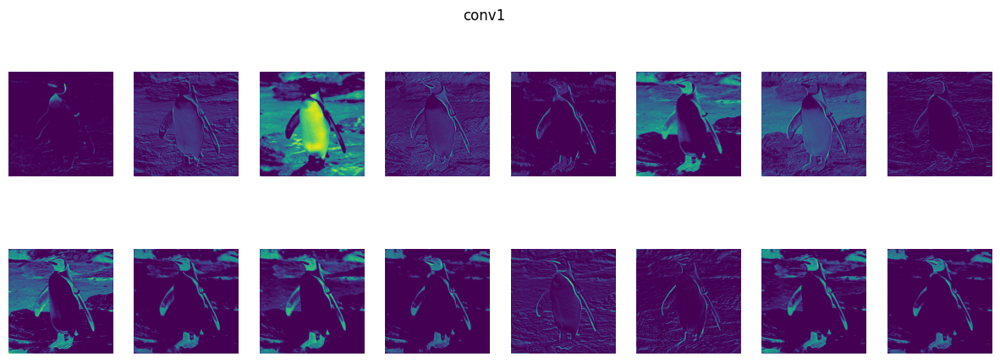

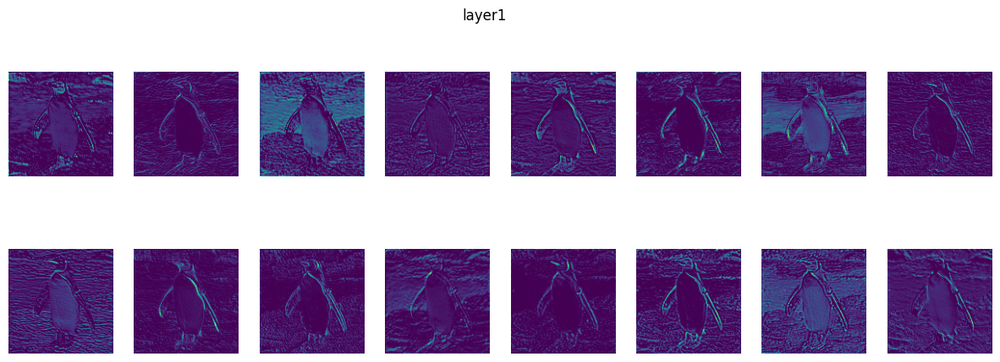

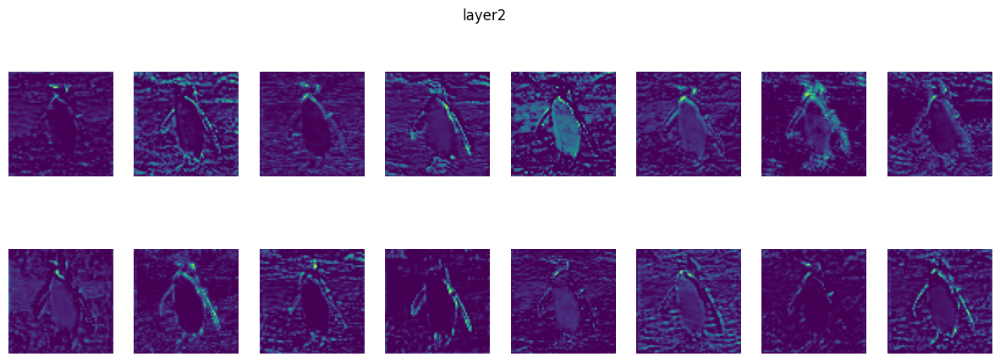

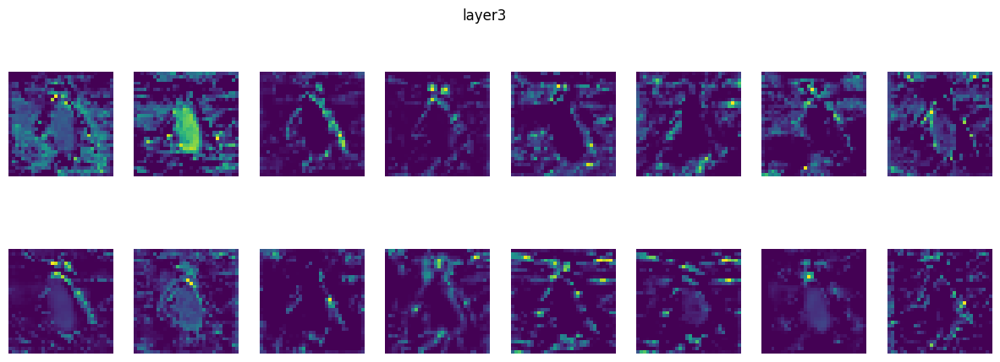

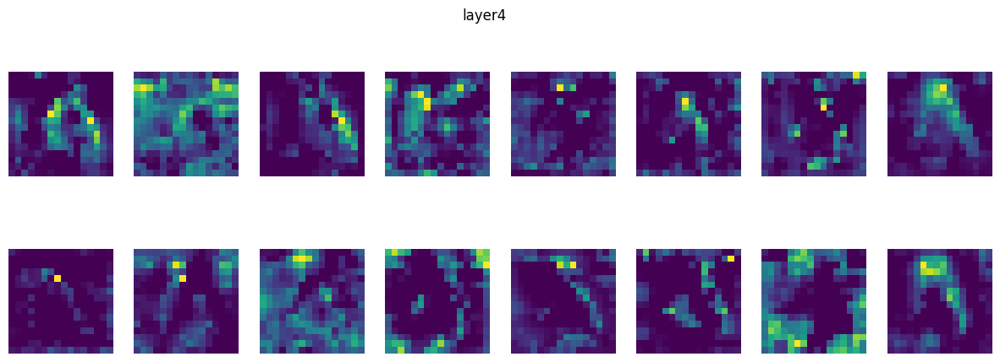

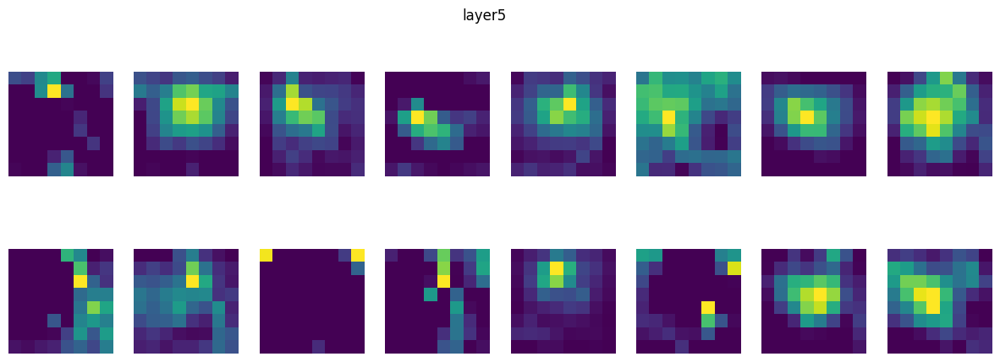

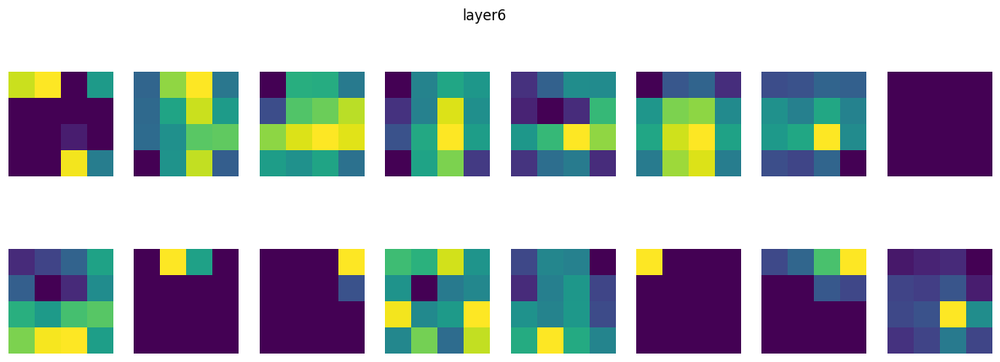

In [35]:
# Visualize the figure here, so it is exported nicely
plot_model_features()  

---

To double-check your work, the cell below will rerun all of the autograder tests.

In [17]:
grader.check_all()

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed